# Computer Vision - Assignment 1 - Image Filtering

#### 10 points   |   Deadline: 24th of March 2024, 23:59   |   Submission site: https://pradoposgrado2324.ugr.es/course/view.php?id=6425

### Student's name: <mark> Mahshad Golafshan </mark>





---



## Submission rules

For this submission (and the same applies to all other course assignments), code, results, discussion, presentation and analysis of the work carried out must be introduced, all integrated into this same Google Colab Notebook. Please remember that **code and results without an explanatory report are not enough (and, as a consequence, the associated mark would be 0)**. In other words, it is essential that the student demonstrates that he/she understands what is doing, and that he/she masters the fundamentals to successfully carry out the assignment and interpret the results obtained.

The main goal of this assignment is to become familiar with the implementation and use of convolutional filters, as well as the calculation of the derivatives of an image and its possible applications.

The cell layout/structure of this Google Colab Notebook template must be respected.

Only the source code will be delivered (`.ipynb` file incorporating code, results, and explanation of the work performed and the results obtained). The images used will not be submitted (because we all employ the same images, and these are shared in https://pradoposgrado2324.ugr.es/mod/url/view.php?id=66982).

The path for reading images, or any other input file, must always be “/content/drive/My Drive/images/file_name”

The code must be well-commented, and presented with the results obtained in each section along with the corresponding comments and discussion. Again, remember that submitting code without an explanatory report does not score.



---



## Support functions and connection to Google Drive


In [1]:
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
# We import the modules to use
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt
# change directory
%cd '/content/drive/My Drive'
#  the current directory
%pwd

# This allows to display images  and to save  them in cells
%matplotlib inline
# this definition allows to read files in a specific path
get_image = lambda route: os.path.join('/content/drive/My Drive/Images/images', route)

/content/drive/My Drive


In [3]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [4]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [5]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Apple',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im has three-channels
    plt.imshow(im, cmap='jet')
  else:
    # im has a single-channel
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([])
  plt.show()

In [6]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Apples',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

# **Exercise 1: mask discretization and Gaussian filtering** (4 points).

In this exercise we will learn to discretize convolution masks and apply them to images using OpenCV functions. We also seek to do it in an efficient way, and that is why, in all this assignment, the use of 1D (separable) convolutions is required.

The PDF document about Gaussian discretization, available in PRADO (https://pradoposgrado2324.ugr.es/pluginfile.php/171241/mod_folder/content/0/SupplementaryMaterials/Gaussian_discretization.pdf), can be helpful in the implementation of this first exercise.





;## A) (1.5 points)

Compute the 1D discrete masks of the Gaussian function, and both its first and second derivatives (normalized). Consider that the input to such a 1D mask creation function can be both a possible sigma or a possible mask size. Use the following sigma values ($\{1, 2.5, 5\}$) and the following mask size values ($\{5, 9, 15\}$), and display the profile (that is, the silhouette of the masks as 1D functions) to verify that the created masks are correct.

In [7]:
#compute the Guassian filter
def GaussFunc(x,sigma):
    return np.exp(-x**2 / (2 * sigma**2))

#compute the first derivative of Guassian filter
def GaussDeriv1Func(x,sigma):
    return -x / (sigma**2) * GaussFunc(x, sigma)

#compute the second derivative of Guassian filter
def GaussDeriv2Func(x,sigma):
    return 1 / (sigma**2) * (-1+ x**2 / sigma**2) * GaussFunc(x, sigma)

#compute 1D discrete masks of the Gaussian
def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    if sigma == 0 and sizeMask == 0:
        raise ValueError("At least one of sigma or sizeMask must be provided.")

#visualizes the masks for various sigma and mask size values
    if sigma != 0:
        sizeMask=2*int(3*sigma)+1
        x = np.arange(-sizeMask // 2+1, sizeMask // 2 + 1)
        if order == 0:
            mask = GaussFunc(x, sigma)
            mask = mask / np.sum(mask)
        elif order == 1:
            mask = GaussDeriv1Func(x, sigma)
            mask = mask*sigma
        elif order == 2:
            mask = GaussDeriv2Func(x, sigma)
            mask = mask*sigma**2
        else:
            raise ValueError("Invalid order. Must be 0, 1, or 2 for Gaussian, first derivative, or second derivative respectively.")
    else:
        if sizeMask % 2 == 0:
            raise ValueError("SizeMask must be odd.")
        x = np.arange(-sizeMask // 2+1, sizeMask // 2 + 1)
        sigma=(sizeMask-1) / 6
        if order == 0:
            mask = GaussFunc(x, (sizeMask-1) / 6)
            mask = mask / np.sum(mask)
        elif order == 1:
            mask = GaussDeriv1Func(x, (sizeMask-1) / 6)
            mask = mask*sigma
        elif order == 2:
            mask = GaussDeriv2Func(x, (sizeMask-1) / 6)
            mask= mask*sigma**2
        else:
            raise ValueError("Invalid order. Must be 0, 1, or 2 for Gaussian, first derivative, or second derivative respectively.")

    return mask

<font color='orange'>

* A Gaussian filter is a type of filter used in image processing and computer vision tasks for blurring and noise reduction. It's based on the Gaussian distribution and is effective in smoothing images while preserving edges. the gaussian(sigma, size) function generates a 1D discrete approximation of the Gaussian function, which can be used as a filter kernel.
* The code defines functions to compute 1D discrete masks of the Gaussian function and its first and second derivatives. It also visualizes the profiles of these masks for various sigma and mask size values.
</font>



<font color='orange'>1. **Gaussian Function**:
   
  <font color='orange'> The 1D Gaussian function is defined as:

   <font color='orange'>$$ G(x) = \frac{1}{\sqrt{2\pi}\sigma} e^{-\frac{x^2}{2\sigma^2}} $$

  <font color='orange'> where \( x \) is the distance from the center, \( \sigma \) is the standard deviation, and \( e \) is the base of the natural logarithm.
</font>

<font color='orange'>2. **First Derivative of Gaussian**:

 <font color='orange'>  The first derivative of the Gaussian <font color='orange'>function with respect to \( x \) is:

   <font color='orange'>$$ G'(x) = -\frac{x}{\sigma^2} G(x) $$

<font color='orange'>3. **Second Derivative of Gaussian**:

  <font color='orange'> The second derivative of the Gaussian function with respect to \( x \) is:

<font color='orange'>   $$ G''(x) = \frac{x^2 - \sigma^2}{\sigma^4} G(x) $$

These formulas describe the Gaussian function and its derivatives used in the computation of the masks.mathematical expressions are translated into Python functions to generate the masks numerically.
</font>

 <font color='orange'>and the numbers come from this formula from corresponding assignment pdf:if T being the size of the mask,


 <font color='orange'>  T = 2·k+1 → k = (T-1)/2 → (T-1)/2 = 3·σ → 2·[3·σ] + 1 = T

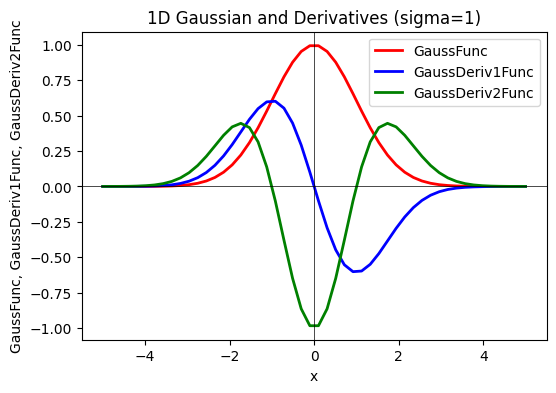

In [8]:
# With the following figure we check that the implemented Gaussian functions are correct
plt.figure(figsize=(6,4))
xvalues = np.linspace(-5, 5)
yvalues1 = GaussFunc(xvalues,1)
yvalues2 = GaussDeriv1Func(xvalues,1)
yvalues3 = GaussDeriv2Func(xvalues,1)
plt.plot(xvalues, yvalues1, lw=2, color='red',
label='GaussFunc')
plt.plot(xvalues, yvalues2, lw=2, color='blue',
label='GaussDeriv1Func')
plt.plot(xvalues, yvalues3, lw=2, color='green',
label='GaussDeriv2Func')
plt.title('1D Gaussian and Derivatives (sigma=1)')
plt.xlabel('x')
plt.ylabel('GaussFunc, GaussDeriv1Func, GaussDeriv2Func')
plt.axhline(0, lw=0.5, color='black')
plt.axvline(0, lw=0.5, color='black')
plt.legend()

WE FIRST SET THE MASK SIZE


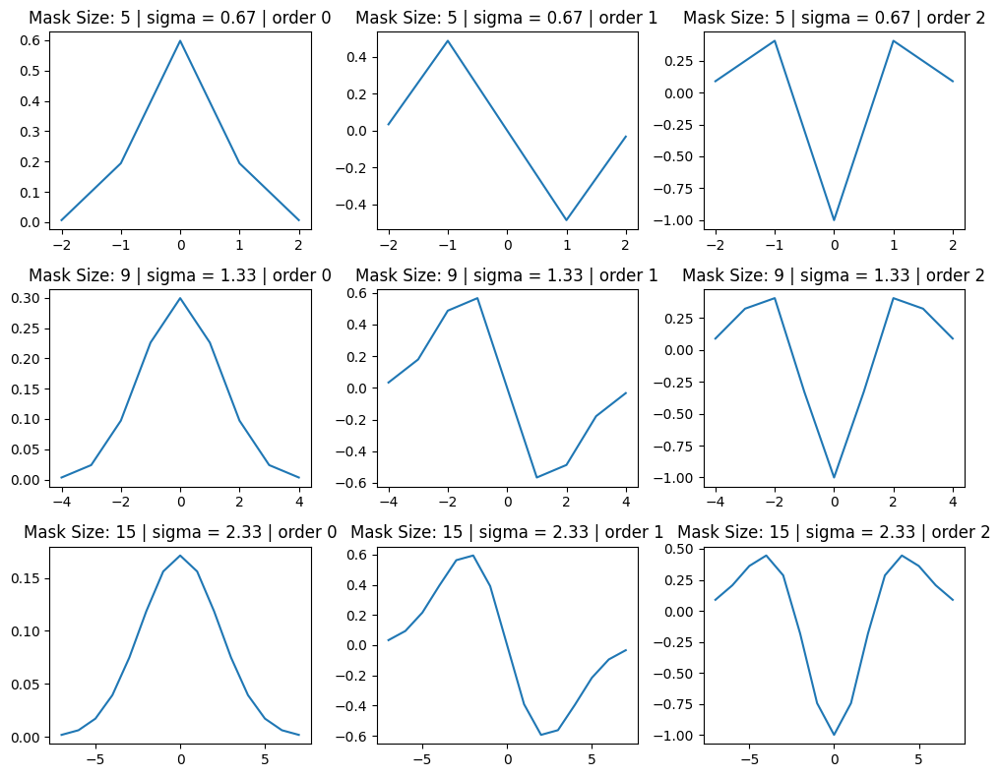

WE NOW SET SIGMA


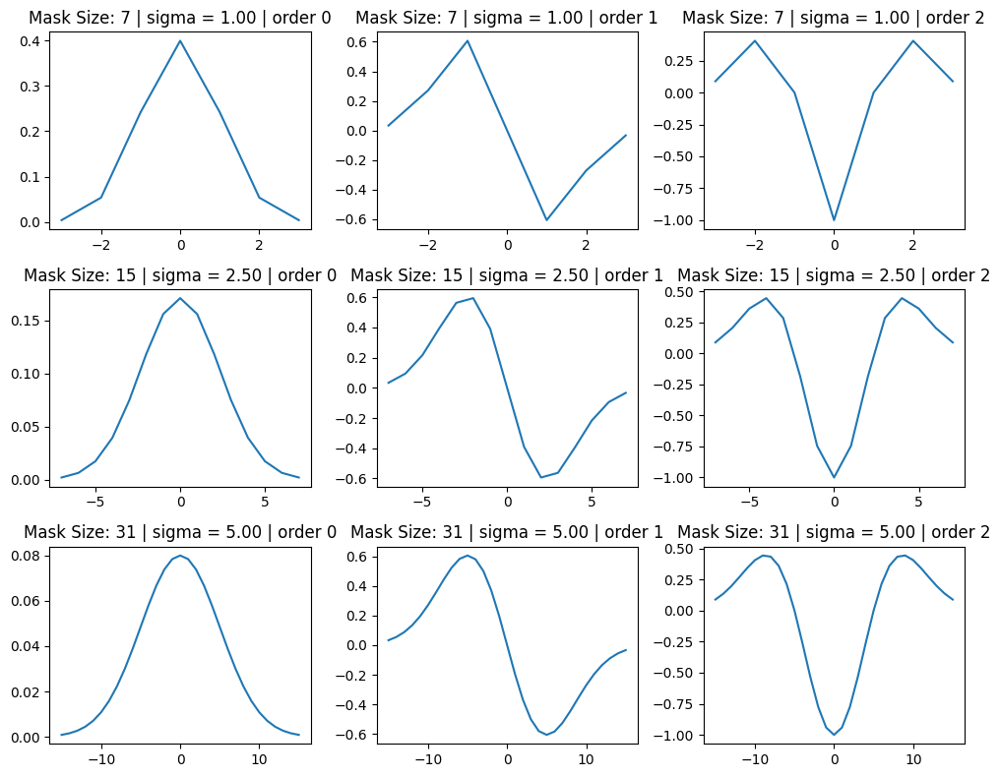

In [173]:
# Define sigma values and mask sizes
sigma_values = [1, 2.5, 5]
size_masks = [5, 9, 15]

print('WE FIRST SET THE MASK SIZE')
plt.figure(figsize=(10, 8))

# Iterate over mask sizes
for i, sizeMask in enumerate(size_masks):
    # Generate x-axis values for the mask
    x = np.arange(sizeMask) - sizeMask // 2

    # Calculate sigma based on the mask size that we have in assignment pdf
    sigma = (sizeMask - 1) / 6

    # Plot masks for order 0, 1, and 2 derivatives
    plt.subplot(3, 3, 3 * i + 1)
    plt.title(f"Mask Size: {sizeMask} | sigma = {sigma:.2f} | order 0")  # Display mask size and sigma in the title
    mask = gaussianMask1D(sizeMask=sizeMask, order=0)
    plt.plot(x, mask, label=f"MaskSize={sizeMask}")

    plt.subplot(3, 3, 3 * i + 2)
    plt.title(f"Mask Size: {sizeMask} | sigma = {sigma:.2f} | order 1")  # Display mask size and sigma in the title
    mask = gaussianMask1D(sizeMask=sizeMask, order=1)
    plt.plot(x, mask, label=f"MaskSize={sizeMask}")

    plt.subplot(3, 3, 3 * i + 3)
    plt.title(f"Mask Size: {sizeMask} | sigma = {sigma:.2f} | order 2")  # Display mask size and sigma in the title
    mask = gaussianMask1D(sizeMask=sizeMask, order=2)
    plt.plot(x, mask, label=f"MaskSize={sizeMask}")

plt.tight_layout()
plt.show()

# Display masks for each sigma with varying mask sizes
plt.figure(figsize=(10, 8))
print('WE NOW SET SIGMA')
for i, sigma in enumerate(sigma_values):
    # Calculate mask size based on sigma that we have in pdf
    sizeMask = 2 * int(3 * sigma) + 1
    x = np.arange(-sizeMask // 2 + 1, sizeMask // 2 + 1)

    # Plot masks for order 0, 1, and 2 derivatives
    plt.subplot(3, 3, 3 * i + 1)
    plt.title(f"Mask Size: {sizeMask} | sigma = {sigma:.2f} | order 0")  # Display mask size and sigma in the title
    mask = gaussianMask1D(sizeMask=sizeMask, order=0)
    plt.plot(x, mask, label=f"MaskSize={sizeMask}")

    plt.subplot(3, 3, 3 * i + 2)
    plt.title(f"Mask Size: {sizeMask} | sigma = {sigma:.2f} | order 1")  # Display mask size and sigma in the title
    mask = gaussianMask1D(sizeMask=sizeMask, order=1)
    plt.plot(x, mask, label=f"MaskSize={sizeMask}")

    plt.subplot(3, 3, 3 * i + 3)
    plt.title(f"Mask Size: {sizeMask} | sigma = {sigma:.2f} | order 2")  # Display mask size and sigma in the title
    mask = gaussianMask1D(sizeMask=sizeMask, order=2)
    plt.plot(x, mask, label=f"MaskSize={sizeMask}")

plt.tight_layout()
plt.show()


<font color='orange'> the relavent sources that help me in this part:
* https://hannibunny.github.io/orbook/preprocessing/04gaussianDerivatives.html

</font>


## B) (1.5 points)

Read a grayscale image and filter it showing the result of the convolution with a Gaussian, with the first derivative of the Gaussian (both in $X$ and $Y$), and with the second derivative of the Gaussian (both in $X$ and $Y$). Use the following sigmas: $\{0.75,2,5,10,15\}$. Display all images within the same canvas, as shown below. In this section, the OpenCV function `sepFilter2D()` must be used with the masks calculated in the previous exercise.




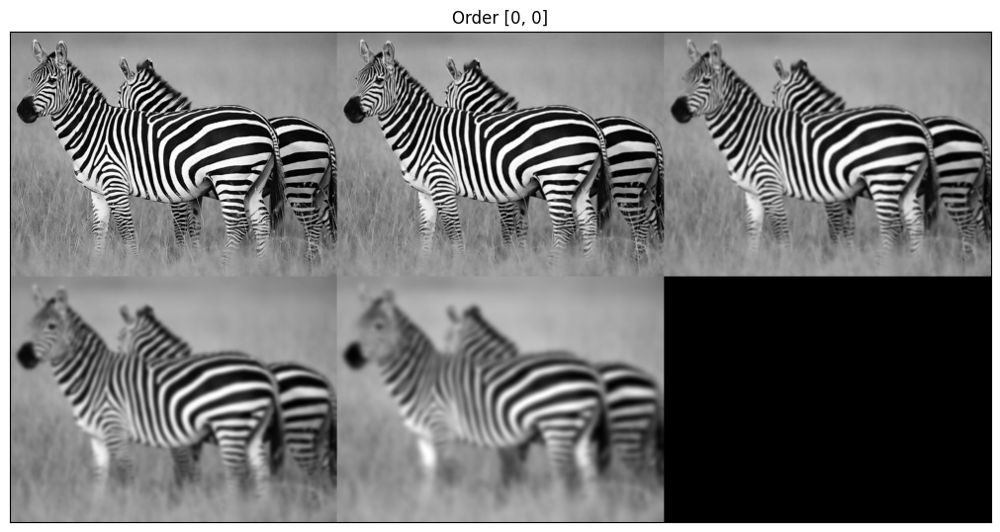

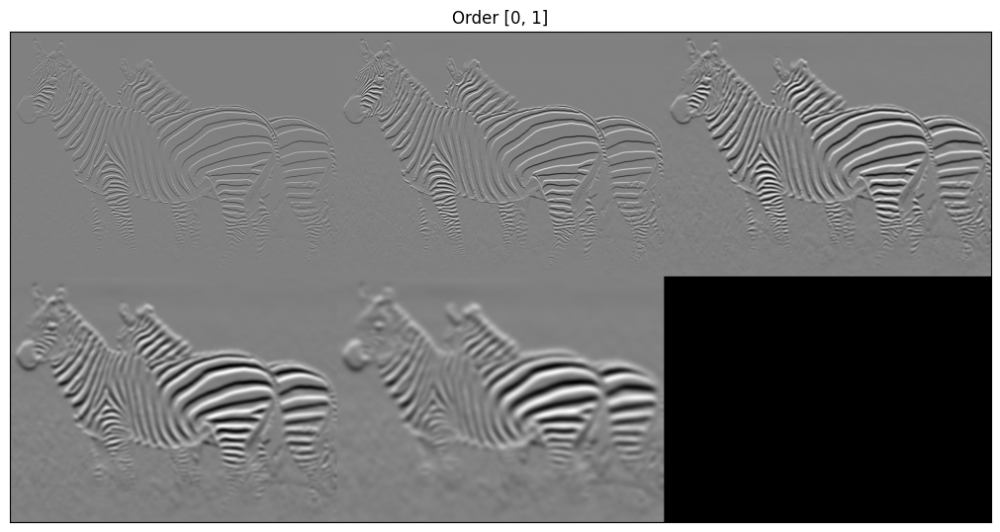

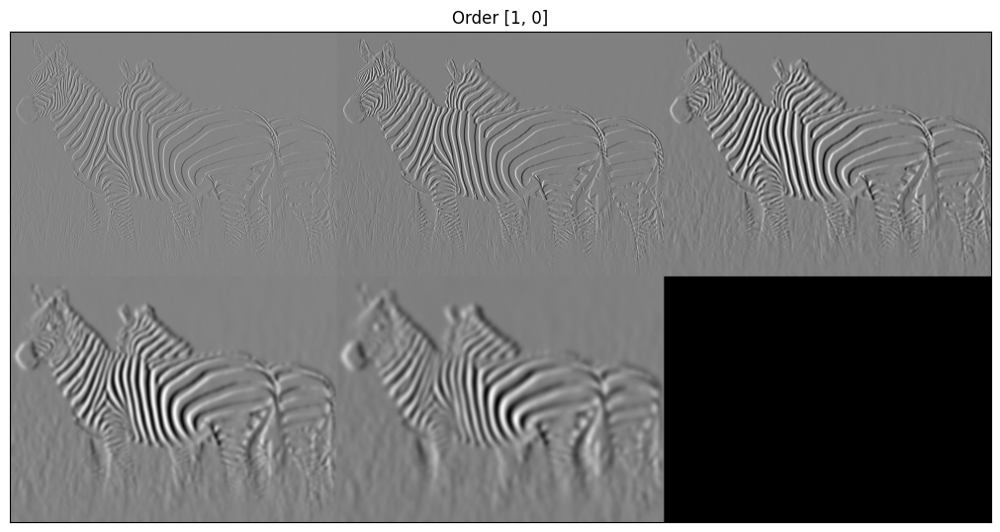

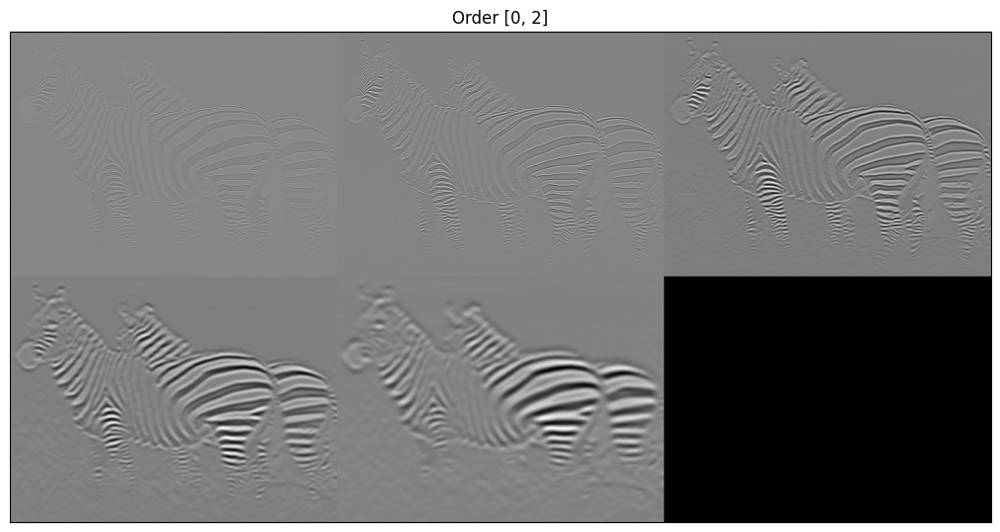

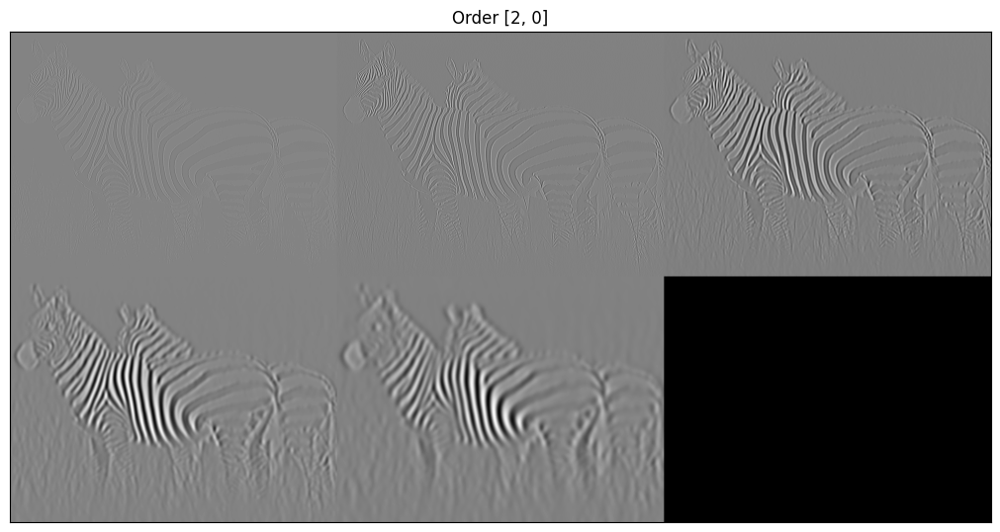

In [169]:
def my2DConv(im, sigma, orders):
    ddepth = cv2.CV_64F  # Specify the depth of the output image
    maskG = gaussianMask1D(sigma, order=0)  # Gaussian mask
    maskDG = gaussianMask1D(sigma, order=1)  # First derivative of Gaussian mask
    mask2DG = gaussianMask1D(sigma, order=2)  # Second derivative of Gaussian mask

    if orders == [0, 0]:  # Gaussian smoothing
        return cv2.sepFilter2D(im, ddepth, maskG, maskG)
    elif orders == [1, 0]:  # First derivative of Gaussian in X direction
        return cv2.sepFilter2D(im, ddepth, maskDG, maskG)
    elif orders == [0, 1]:  # First derivative of Gaussian in Y direction
        return cv2.sepFilter2D(im, ddepth, maskG, maskDG)
    elif orders == [2, 0]:  # Second derivative of Gaussian in X direction
        return cv2.sepFilter2D(im, ddepth, mask2DG, maskG)
    elif orders == [0, 2]:  # Second derivative of Gaussian in Y direction
        return cv2.sepFilter2D(im, ddepth, maskG, mask2DG)
    else:
        print('error in order of derivative')  # Print error

# Let's check the function
im = readIm(get_image('zebra.jpg'), 0)  # Read the image

vim = [[] for _ in range(5)]  # store convolved images
orders = [[0, 0], [0, 1], [1, 0], [0, 2], [2, 0]]  # orders of derivatives
for i in range(5):
    for sigma in [0.75, 2, 5, 10, 15]:  # Different sigma values
        vim[i].append(rangeDisplay01(my2DConv(im, sigma, orders[i]), True))  # Convolve and store convolved image
    displayMI_ES(vim[i], title=f'Order {orders[i]}', factor=2)  # Display convolved images


<font color='orange'>
we Apply 2D convolution to the input image 'im' with a Gaussian or its derivatives masks. a function my2DConv for applying 2D convolution to an input image with Gaussian or its derivatives masks. It then checks the function by convolving a given image with different orders of derivatives and sigma values, and displays the resulting images. The comments provide detailed explanations of the function parameters, its behavior for different orders of derivatives, and the process of checking the function.

## C) (1 point)

Use the OpenCV function `sepFilter2D()` and $\sigma=3.0$ to calculate the gradient (4 images: $X$ derivative, $Y$ derivative, magnitude and orientation) and the Laplacian of Gaussian.

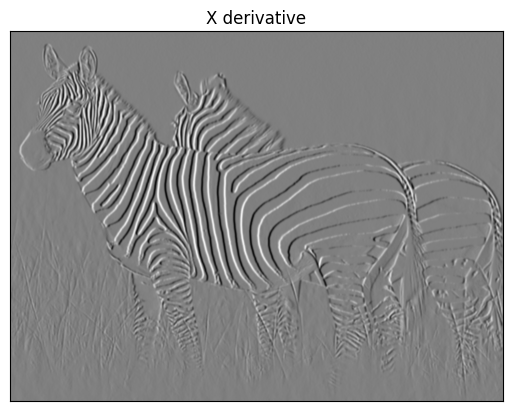

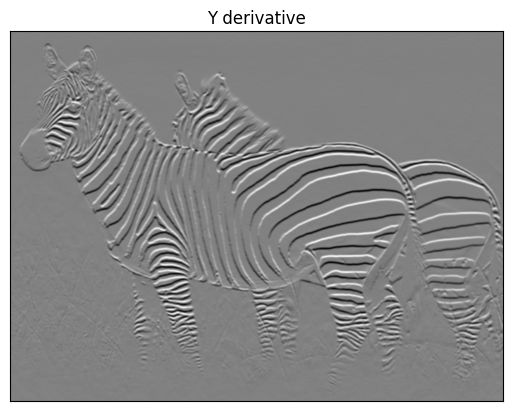

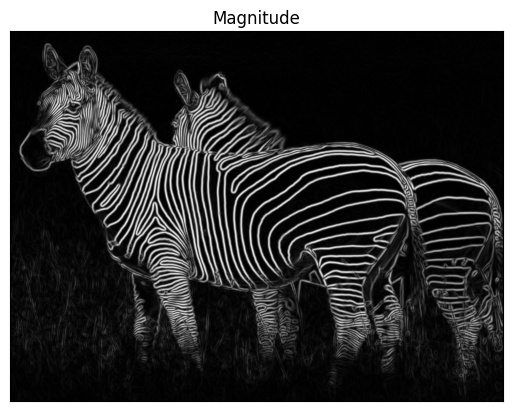

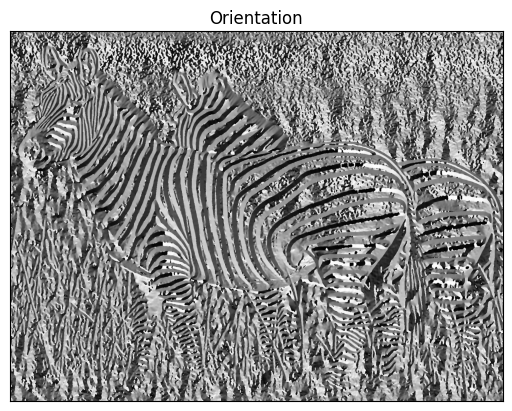

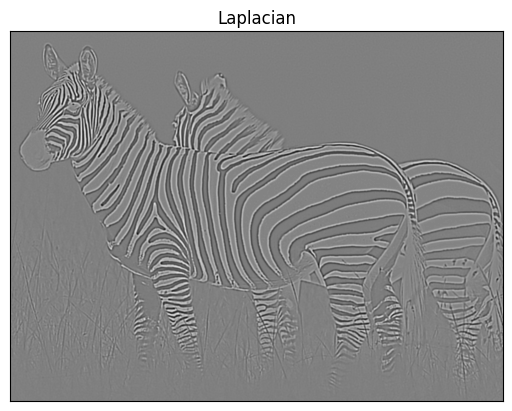

In [170]:
# Set sigma value
sigma = 3

# Read the image using OpenCV and convert it to grayscale
im = readIm(get_image('zebra.jpg'), 0)

# Specify the depth of the output image
ddepth = cv2.CV_64F

# Generate Gaussian masks for order 0, 1, and 2 derivatives
maskG = gaussianMask1D(sigma, order=0)
maskDG = gaussianMask1D(sigma, order=1)
mask2DG = gaussianMask1D(sigma, order=2)

# Compute the X derivative of the image using sepFilter2D
x_derivative = cv2.sepFilter2D(im, ddepth, maskDG, maskG)

# Compute the Y derivative of the image using sepFilter2D
y_derivative = cv2.sepFilter2D(im, ddepth, maskG, maskDG)

# Compute the magnitude of the gradient using X and Y derivatives
magnitude = np.sqrt(x_derivative**2 + y_derivative**2)

# Compute the orientation of the gradient using X and Y derivatives
orientation = np.arctan2(x_derivative, y_derivative)

# Compute the Laplacian of Gaussian using sepFilter2D
laplacian = cv2.sepFilter2D(im, ddepth, mask2DG, maskG) + cv2.sepFilter2D(im, ddepth, maskG, mask2DG)

# Display the computed images
displayIm(x_derivative, title='X derivative', factor=1)
displayIm(y_derivative, title='Y derivative', factor=1)
displayIm(magnitude, title='Magnitude', factor=1)
displayIm(orientation, title='Orientation', factor=1)
displayIm(laplacian, title='Laplacian', factor=1)


<font color='orange'>function sepFilter2D() with a sigma value of 3.0 to compute various gradient-related images: X and Y derivatives, magnitude, orientation, and the Laplacian of Gaussian.
 $$
magnitude = \sqrt{G_x^2+G_y^2}
$$
$$
orientation = tan^{-1}(\frac{G_y}{G_x})
$$

# **Exercise 2**:  Gaussian and Laplacian pyramids (3 points)







## A) (1.5 points)

Build a 4-level Gaussian pyramid using $7\times7$ size Gaussian masks. Using the OpenCV `pyrUp()` and `pyrDown()` functions is not allowed.

In [14]:
'''
This function displays a pyramid of images, providing as input the list of images to display.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1, cv2.resize(im1,(im1.shape[0]//2,im1.shape[1]//2),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//4,im1.shape[1]//4),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//8,im1.shape[1]//8),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//16,im1.shape[1]//16),cv2.INTER_LINEAR)]

displayPyramid(images, title='Apples Pyramid')

'''
def displayPyramid(vim, title='result'):
  temp = np.zeros_like(vim[0])
  if np.mod(temp.shape[1],2)==0:
    h = temp[:, :temp.shape[1]//2]
  else:
    h = temp[:, :(temp.shape[1]//2)+1]
  out = np.hstack((temp, h))
  top = 0
  out[0:vim[0].shape[0], 0:vim[0].shape[1]] = vim[0]
  left = vim[0].shape[1]
  for i in range(1, len(vim)):
    out[top:top+vim[i].shape[0], left:left + vim[i].shape[1]] = vim[i]
    top += vim[i].shape[0]
  displayIm(out, title)

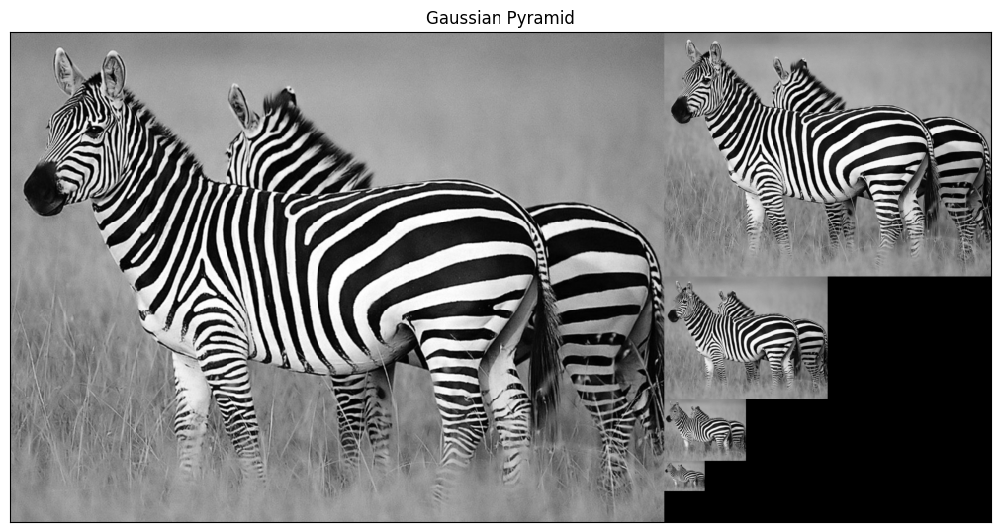

In [171]:
def pyramidGauss(im, sizeMask=7, nlevel=4):
    # Initialize a list to store pyramid levels, starting with the original image
    vim = [im]

    # Convert sizeMask to sigma (because in the my2DConv we only use sigma)
    sigma = (sizeMask - 1) / 6

    # Generate Gaussian pyramid levels
    for _ in range(nlevel):
        # Blur the last image in the pyramid
        blurred_im = my2DConv(vim[-1], sigma, [0, 0])

        # Resize the blurred image
        resized_im = cv2.resize(blurred_im, (blurred_im.shape[1] // 2, blurred_im.shape[0] // 2), cv2.INTER_LINEAR)

        # Append the resized image to the pyramid list
        vim.append(resized_im)

    # Return the Gaussian pyramid
    return vim

# Read the input image
im = readIm(get_image('zebra.jpg'), 0)

# Create a Gaussian pyramid
pyrG = pyramidGauss(im, sizeMask=7, nlevel=4)

# Display the Gaussian pyramid
displayPyramid(pyrG, 'Gaussian Pyramid')


<font color='orange'>It describes how the Gaussian pyramid is constructed by repeatedly blurring and downsampling the input image. The function takes parameters for the initial mask size (sizeMask) and the number of pyramid levels (nlevel). The resulting Gaussian pyramid is then displayed using the displayPyramid function.

## B) (1 point)

Use your code from the previous section to implement a function that allows you to build a 4-level Laplacian pyramid.

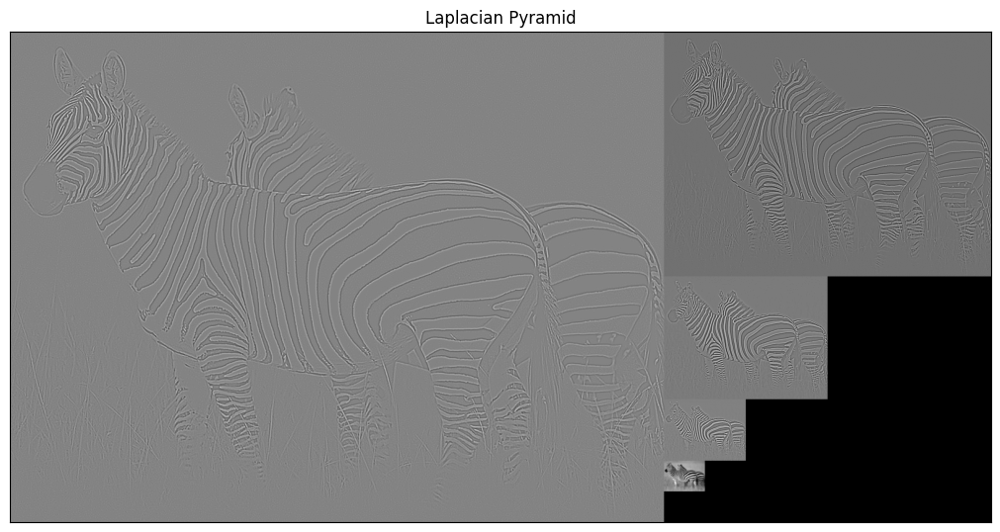

In [172]:
# Define resize function
def resize(im, multiply):
    return cv2.resize(im, (im.shape[1] * multiply, im.shape[0] * multiply), cv2.INTER_LINEAR)

# Define Laplacian pyramid function
def pyramidLap(im, sizeMask, nlevel=4, flagInterp=cv2.INTER_LINEAR):
    # Generate Gaussian pyramid levels
    vim = pyramidGauss(im, sizeMask=sizeMask, nlevel=nlevel)
    vimL = []

    # Compute Laplacian pyramid levels
    for i in range(len(vim) - 1):
        # Compute the Difference of Gaussian (DoG) between current level and the resized next level
        DoG = vim[i] - resize(vim[i + 1], multiply=2)

        # Append the DoG to the Laplacian pyramid list
        vimL.append(DoG)

    # Append the last level of the Gaussian pyramid to the Laplacian pyramid
    vimL.append(vim[-1])

    # Return the Laplacian pyramid
    return vimL

# Read the input image
im = readIm(get_image('zebra.jpg'), 0)

# Create a Laplacian pyramid
pyrL = pyramidLap(im, sizeMask=7, nlevel=4)

# Normalize the values in Laplacian
pyrL = [rangeDisplay01(x) for x in pyrL]

# Display the Laplacian pyramid
displayPyramid(pyrL, 'Laplacian Pyramid')


<font color='orange'> Resize the input image by multiplying its dimensions by a specified factor.
        multiply (int): Factor by which to multiply the dimensions of the image.
Create a Laplacian pyramid of an input image.

<font color='orange'>*  sizeMask (int): Size of the Gaussian mask used for blurring in the pyramid.


<font color='orange'>* nlevel (int): Number of levels in the pyramid.


<font color='orange'>* flagInterp (int): Interpolation flag for resizing images.
        
  

<font color='orange'> The Laplacian pyramid is created by subtracting the resized versions of Gaussian pyramid levels from each other. The resulting Laplacian pyramid is then displayed using the displayPyramid function.

<font color='brown'>
challenge:I dont know why my result depth is shallower than what it should be? but it is not really a big deal and I thiought it might because of the size of the output that is bigger than it should be and when it is become smaller then the image become more comress and the depth is more clear than now.


## C) (0.5 points)

Now implement a function to reconstruct the image encoded/stored in the Laplacian pyramid. Verify that it is possible to obtain an exact copy of the original image. To do this, calculate the reconstruction error as the Euclidean norm of the differences between the intensity levels of the original image and the reconstructed image.

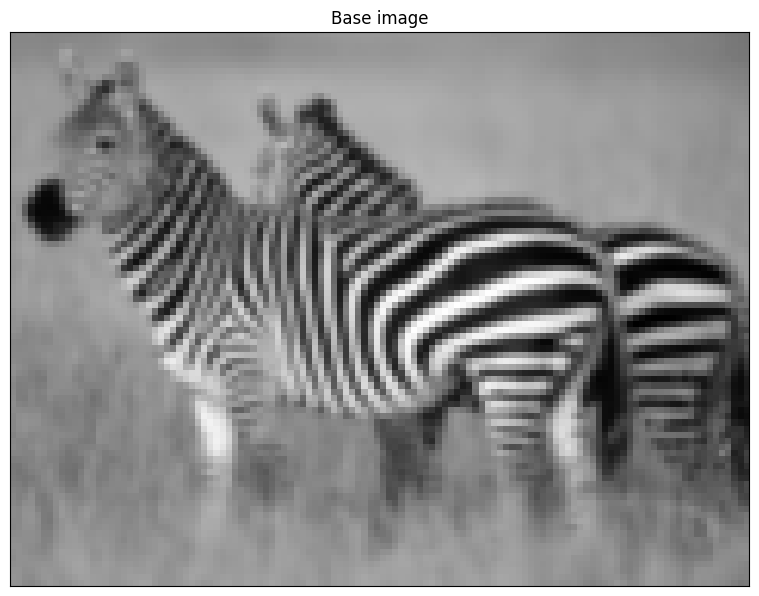

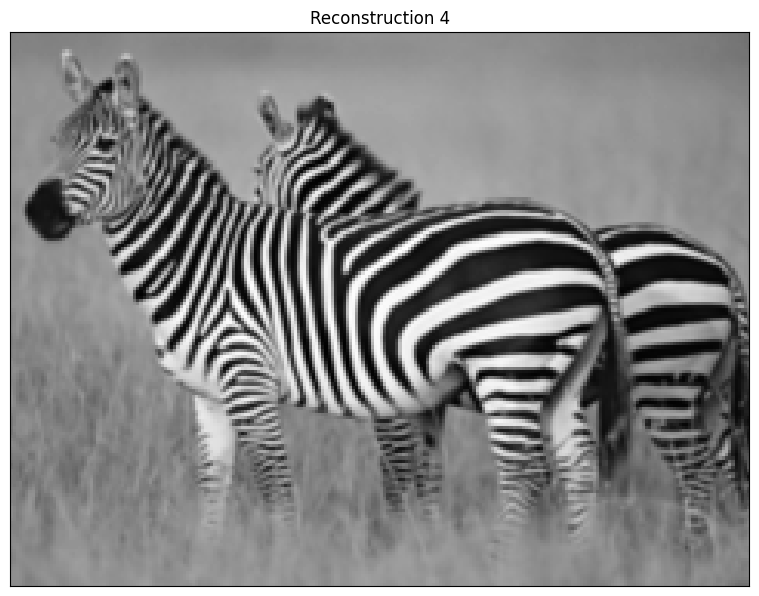

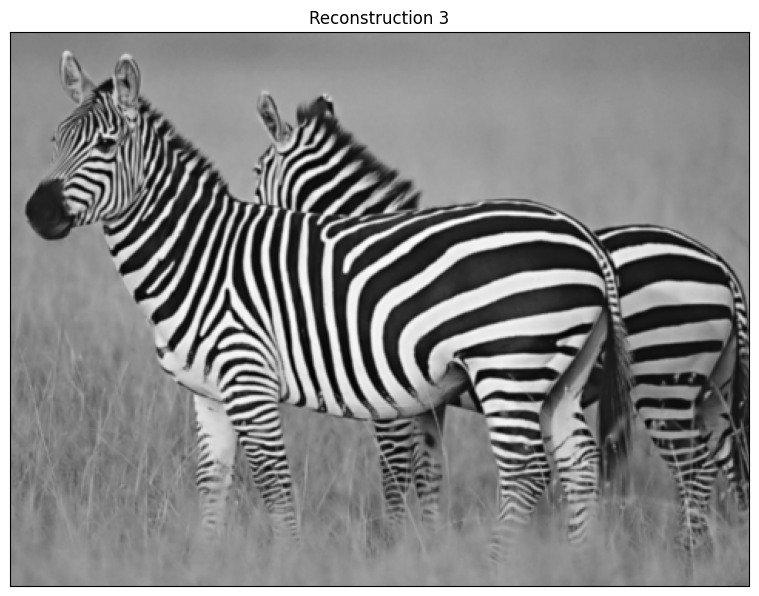

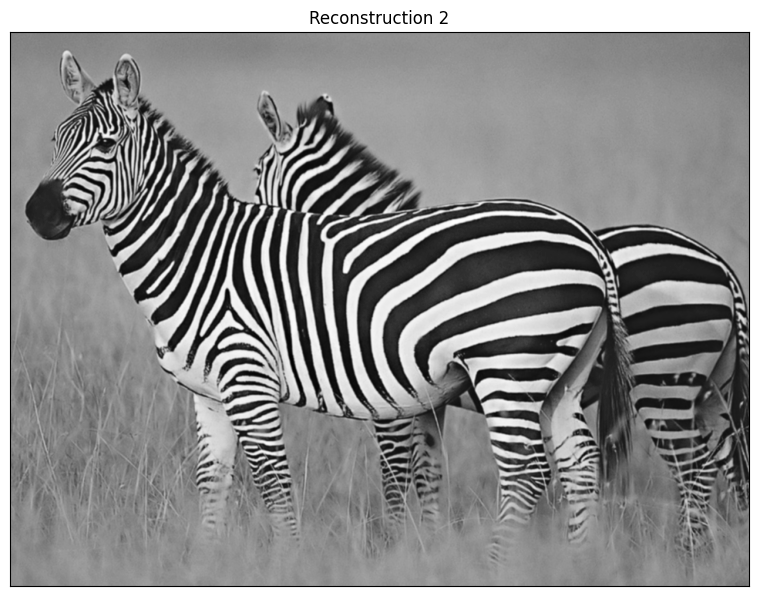

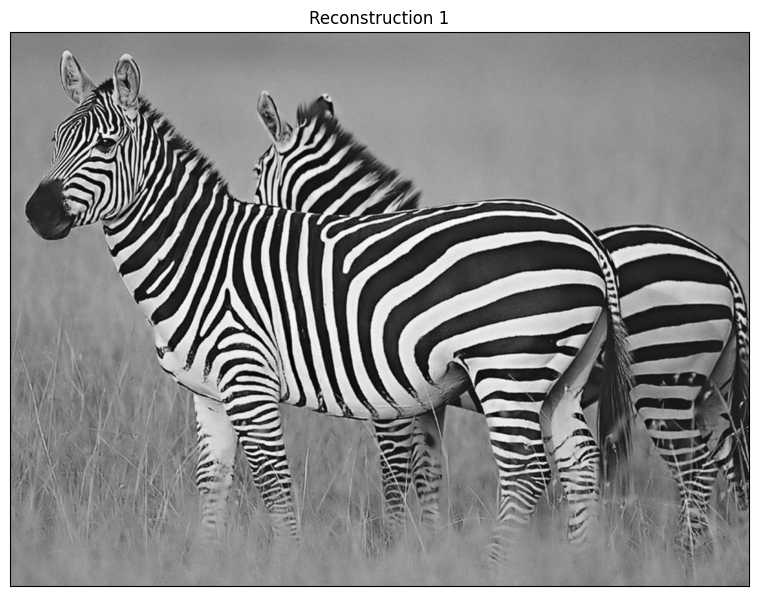

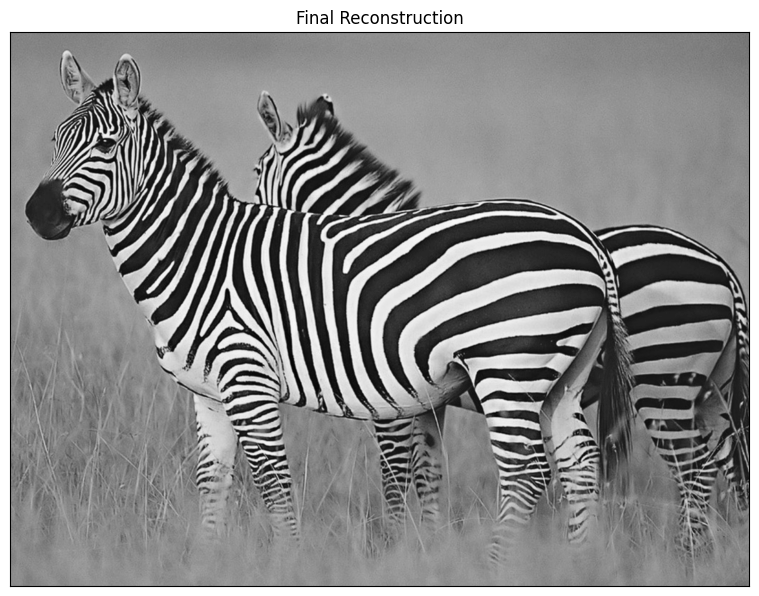

Error per pixel: 0.2767304848805622


In [168]:
# Define a function to reconstruct an image from its Laplacian pyramid
def reconstructLap(pyL, flagInterp=0):
    # Initialize the reconstructed image with the last level of the Laplacian pyramid
    im = pyL[-1]

    # Iterate through the levels of the Laplacian pyramid in reverse order
    for i in range(1, len(pyL)):
        # Resize the current reconstructed image to the dimensions of the next level
        im = cv2.resize(im, (pyL[-i - 1].shape[1], pyL[-i - 1].shape[0]))
        # Add the next level of the Laplacian pyramid to the resized image
        im += pyL[-i - 1]

        # Check if the current level matches the flagInterp index
        if len(pyL) - i - 1 == flagInterp:
            return im

# Initialize a list to store reconstructed images
reconstructions = []

# Iterate through different flagInterp values for reconstruction
for flag in range(5):
    # If flag is 4, append the base image (last level of the Laplacian pyramid)
    if flag == 4:
        reconstructions.append(pyrL[-1])
    # Otherwise, reconstruct the image using the Laplacian pyramid and the current flagInterp value
    else:
        recons = reconstructLap(pyrL, flag)
        reconstructions.append(recons)

# reconstructed images in reverse order for display
for i, recons in enumerate(reconstructions[::-1]):
    if i == 0:
        title = 'Base image'
    else:
        title = f'Reconstruction {5 - i}'

    # Display the reconstructed image
    displayIm(recons, title, factor=1.5)
displayIm(reconstructions[0], 'Final Reconstruction', factor=1.5)

# Compute and print the error per pixel between the original image and the final reconstruction
print('Error per pixel:', np.sqrt(np.linalg.norm(im - np.round(reconstructions[0]), ord=2) / np.prod(im.shape)))


<font color='orange'>Reconstruct an image from its Laplacian pyramid.pyL (list): List containing the levels of the Laplacian pyramid. flagInterp (int): Index indicating where to stop the reconstruction process.

<font color='orange'>reconstruct an image from its Laplacian pyramid levels. The function iterates through the levels of the Laplacian pyramid in reverse order, resizing and adding each level to the reconstructed image. The reconstructed images are then displayed, and the error per pixel between the original image and the final reconstruction is computed and printed.






<font color='brown'>challenge:
I could not find the problem of the error that the error is not equal to zero what ever i try anything but still the 0.2 for error is acceptable so I erge to leave it with only 0,2 error

# **Exercise 3: Hybrid Images** (2 points)

This exercise is inspired on the following paper: $\textit{Oliva, A., Torralba, A., & Schyns, P. G. (2006). Hybrid images. ACM Transactions on Graphics (TOG), 25(3), 527-532}$. (https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf).  

The goal is to learn how the distance affects the human visual system when it extracts information about an object. To do this, we build a hybrid image from two images of different objects. By properly mixing part of the high frequencies of one image with part of the low frequencies of another image, we obtain a hybrid image whose perception differs with distance. The sigma used to filter both images (both high and low frequencies) is the key aspect to select the high and low frequency range of each image. The higher the sigma value, the greater the removal of high frequencies from the image. It is recommended to choose this value separately for each of the images and, in fact, it is possible (and even desirable) to have different values for different pairs of images. Remember to use the Gaussian pyramid to show the effect obtained.

In particular, the students are required to generate, at least, the hybrid images corresponding to Einstein-Marilyn, Cat-Dog, and Fish-Submarine, as shown below.

In [164]:
# Define hybrid function
def hybrid_image(image1, image2, sigma1, sigma2):
    # Combine low-pass and high-pass images to create the hybrid image
    hybrid = my2DConv(image1, sigma1, [0, 0]) + (image2 - my2DConv(image2, sigma2, [0, 0]))

    # Return
    return hybrid


<font color='orange'>Create a hybrid image by combining low-pass and high-pass components of two input images.
        sigma1 (float): Standard deviation of the Gaussian kernel for blurring in the first image.
        sigma2 (float): Standard deviation of the Gaussian kernel for blurring in the second image.


<font color='orange'>the hybrid_image function takes two input images, image1 and image2, and their respective standard deviations sigma1 and sigma2 for Gaussian blurring. It then combines the low-pass component of image1 with the high-pass component of image2 to create a hybrid image. The function returns the resulting hybrid image.

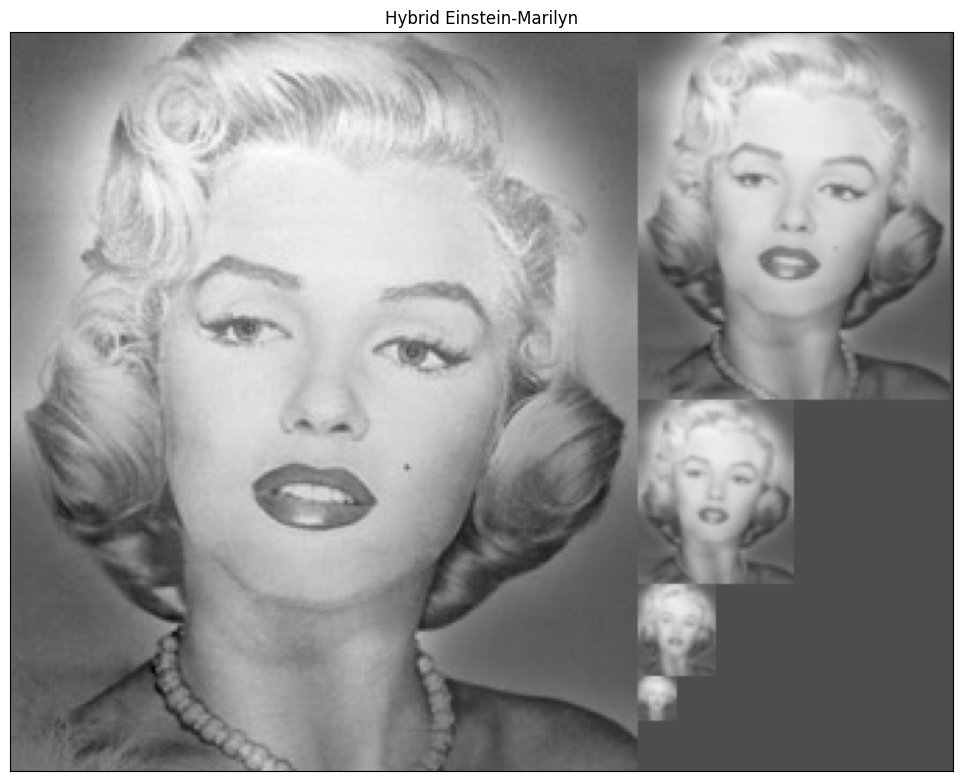

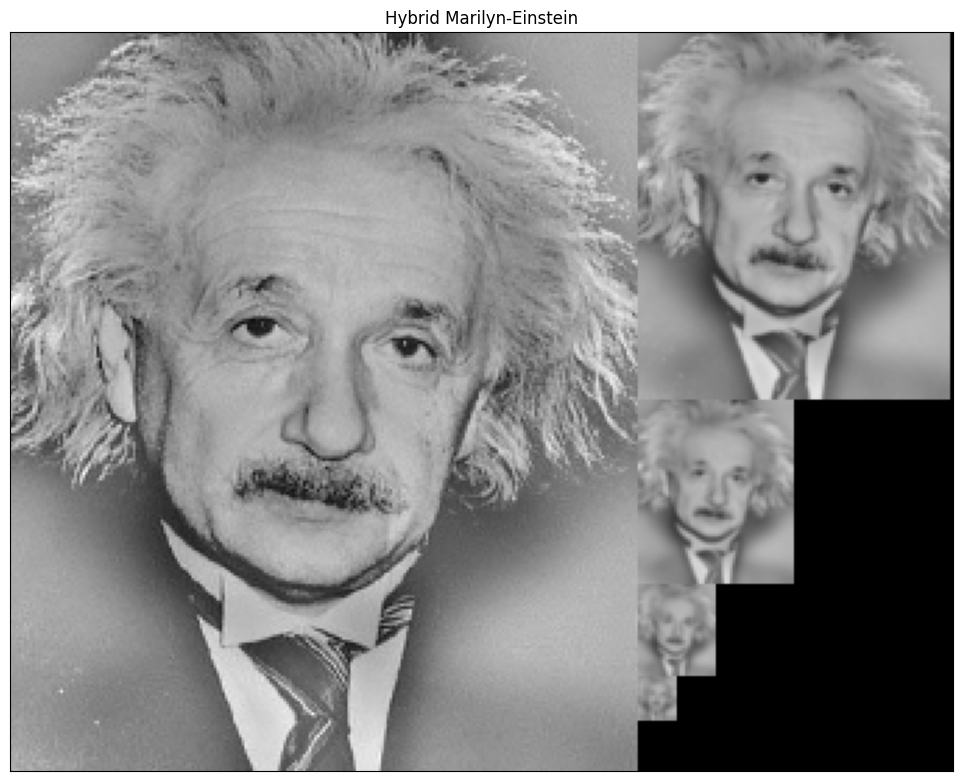

In [165]:
# Load the images of Einstein and Marilyn
einstein = readIm(get_image('einstein.bmp'), 0)  # Read and convert to grayscale
marilyn = readIm(get_image('marilyn.bmp'), 0)   # Read and convert to grayscale

# Display the Gaussian pyramid of the hybrid image of Einstein and Marilyn
displayPyramid(pyramidGauss(hybrid_image(einstein, marilyn, 10, 10)), title='Hybrid Einstein-Marilyn')

# Display the Gaussian pyramid of the hybrid image of Marilyn and Einstein
displayPyramid(pyramidGauss(hybrid_image(marilyn, einstein, 10, 10)), title='Hybrid Marilyn-Einstein')


<font color='orange'>creates hybrid images by combining them using the hybrid_image function with specified sigma values for Gaussian blurring, and then displays the Gaussian pyramid of each hybrid image using the displayPyramid function. The first hybrid image is a combination of Einstein as the low-frequency component and Marilyn as the high-frequency component, while the second hybrid image is the reverse.

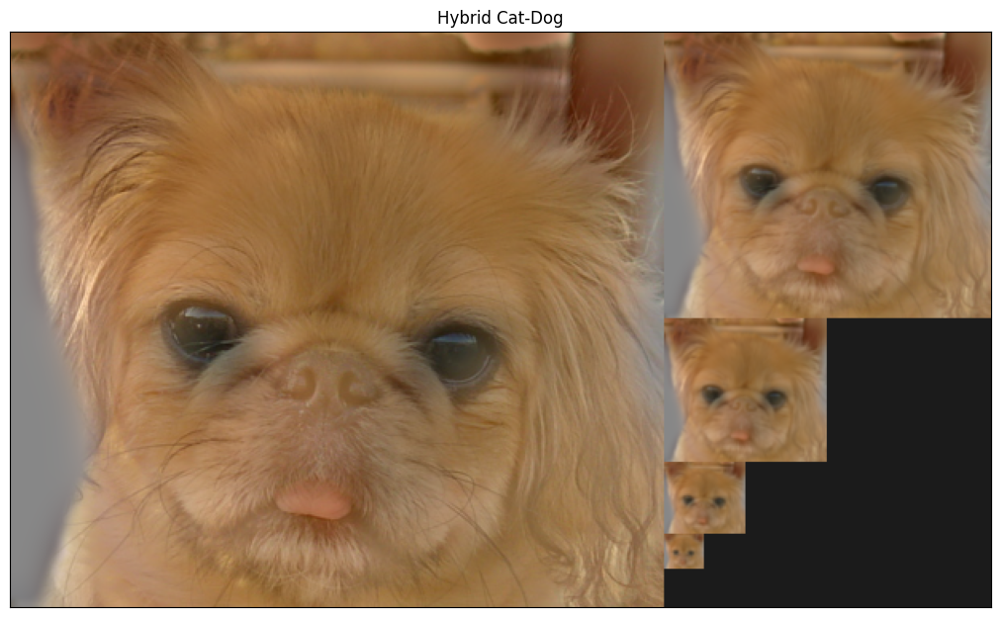

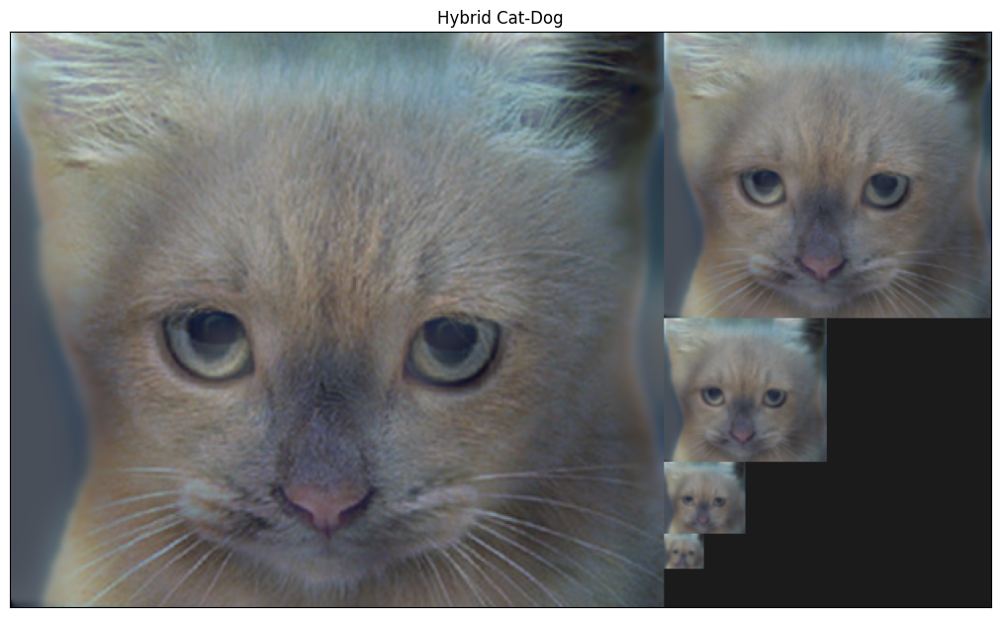

In [83]:
cat= readIm(get_image('cat.bmp'),1)  #  this time in color
dog = readIm(get_image('dog.bmp'),1) #  this time in color

displayPyramid(pyramidGauss(hybrid_image(cat, dog, 10,10)),title='Hybrid Cat-Dog') # the sigma is 10
displayPyramid(pyramidGauss(hybrid_image(dog, cat, 10,10)),title='Hybrid Cat-Dog')


<font color='orange'>in the colored version we can see the hybrid image obtain the color of base image so the color will not chaange in hybrided image

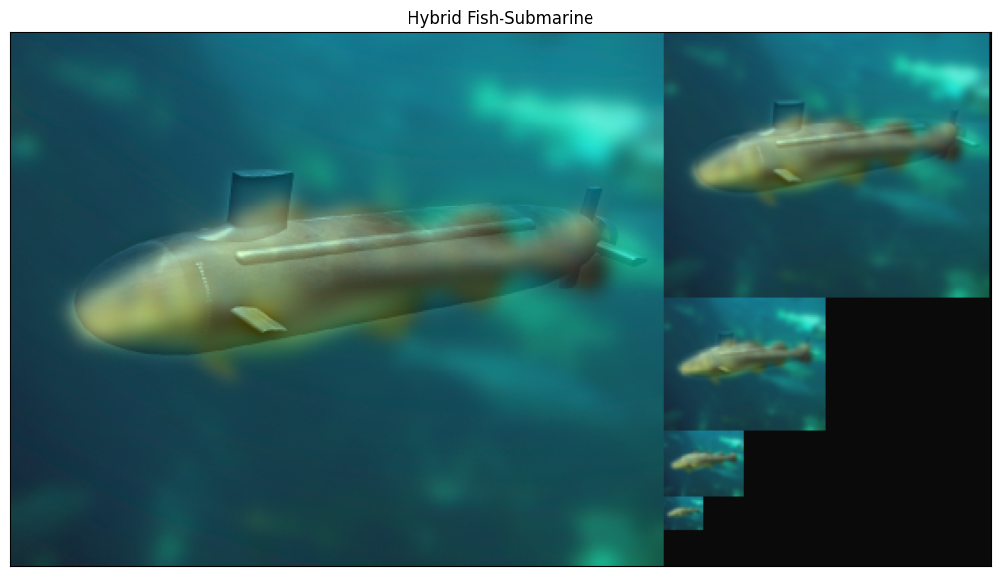

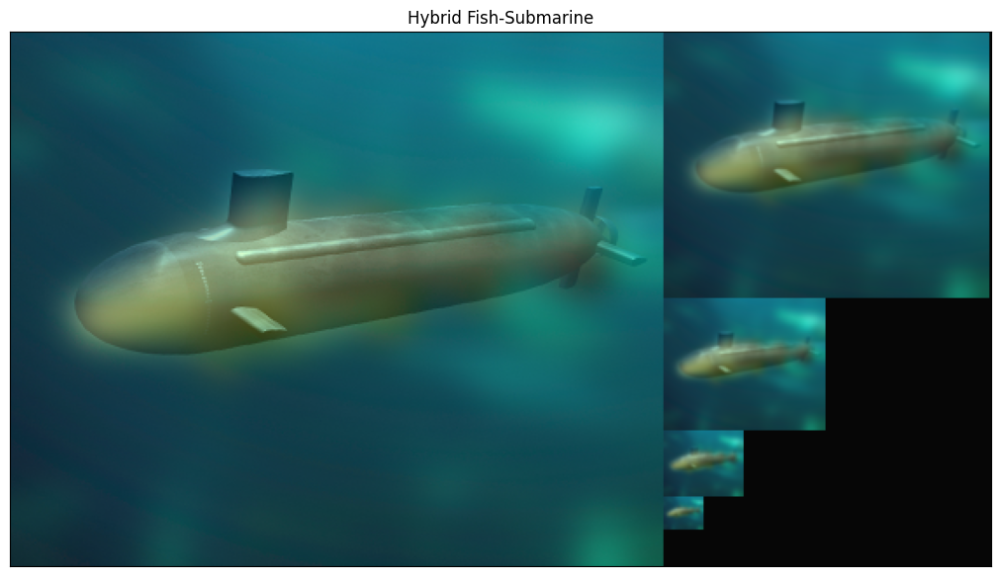

In [166]:
fish= readIm(get_image('fish.bmp'),1) # this time also in color
sub= readIm(get_image('submarine.bmp'),1)

displayPyramid(pyramidGauss(hybrid_image(fish,sub,5,5)),title='Hybrid Fish-Submarine') # compare the two image in different sigma
displayPyramid(pyramidGauss(hybrid_image(fish,sub,10,10)),title='Hybrid Fish-Submarine')


<font color='orange'>as we can see the second one with the sigma of 10 is more vanish than the first one with the sigma of 5 and this is the effect of sigma in hybrid images

# **Exercise 4: Pyramid Blending** (1 point)

In this exercise you must create the merged image (horizontal) of the apple (`apple.jpg`) and the orange (`orange.jpg`) using the $\textit{Pyramid Blending}$ technique. It is recommended to use the OpenCV functions `pyrDown` and `pyrUp` (and explain its working/functioning). It is also essential to explain in detail the process followed when creating the new image (mixture of both), and the blending effect in the resulting image should be appropriate (like in the example displayed below).  



<font color='orange'> vertical and horizontal  blending

</font>




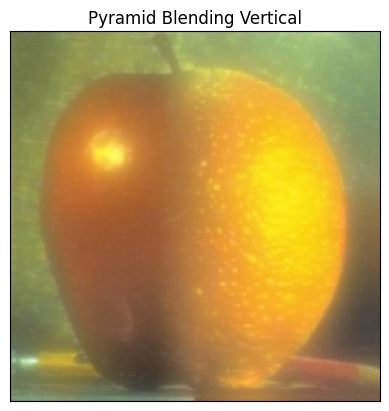

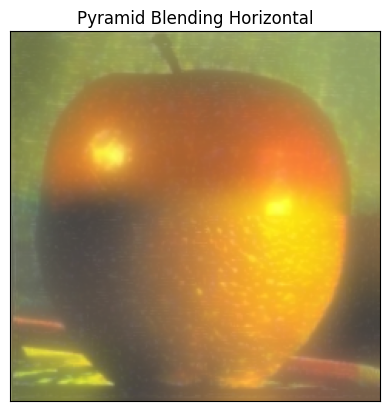

In [167]:
# Load images
apple = readIm(get_image('apple.jpg'))
orange = readIm(get_image('orange.jpg'))

# Resize the apple image to have the same dimensions as the orange image
apple = cv2.resize(apple, (orange.shape[1], orange.shape[0]), cv2.INTER_LINEAR)

# Define Gaussian pyramid function
def build_gaussian_pyramid(image, levels):
    pyramid = [image]
    for _ in range(levels):
        image = cv2.pyrDown(image)
        pyramid.append(image)
    return pyramid

# Construct Gaussian pyramids for both apple and orange images
apple_pyramid = build_gaussian_pyramid(apple, 4)  # Build Gaussian pyramid for apple image
orange_pyramid = build_gaussian_pyramid(orange, 4)  # Build Gaussian pyramid for orange image

# Define Laplacian pyramid function
def build_laplacian_pyramid(gaussian_pyramid):
    pyramid = [gaussian_pyramid[-1]]
    for i in range(len(gaussian_pyramid) - 2, -1, -1):
        expanded = cv2.pyrUp(gaussian_pyramid[i + 1], dstsize=(gaussian_pyramid[i].shape[1], gaussian_pyramid[i].shape[0]))
        laplacian = cv2.subtract(gaussian_pyramid[i], expanded[:gaussian_pyramid[i+1].shape[1]*2, :gaussian_pyramid[i+1].shape[0]*2])
        pyramid.append(laplacian)
    pyramid.reverse()
    return pyramid

# Construct Laplacian pyramids for both apple and orange images
apple_laplacian = build_laplacian_pyramid(apple_pyramid)  # Build Laplacian pyramid for apple image
orange_laplacian = build_laplacian_pyramid(orange_pyramid)  # Build Laplacian pyramid for orange image

# Blend the Laplacian pyramids horizontally and vertically
blended_laplacian_v = []  # List to store vertically blended Laplacian pyramids
blended_laplacian_h = []  # List to store horizontally blended Laplacian pyramids
for apple_lap, orange_lap in zip(apple_laplacian, orange_laplacian):
    blended_laplacian_v.append(np.hstack((apple_lap[:, :int(apple_lap.shape[1]/2)], orange_lap[:, int(orange_lap.shape[1]/2):])))
    blended_laplacian_h.append(np.vstack((apple_lap[:int(apple_lap.shape[1]/2),:], orange_lap[int(orange_lap.shape[1]/2):,:])))

# Define a function to reconstruct an image from its Laplacian pyramid
def reconstruct_image(laplacian_pyramid):
    reconstructed_image = laplacian_pyramid[-1]
    for i in range(len(laplacian_pyramid) - 2, -1, -1):
        reconstructed_image = cv2.pyrUp(reconstructed_image, dstsize=(laplacian_pyramid[i].shape[1], laplacian_pyramid[i].shape[0]))
        reconstructed_image = cv2.add(reconstructed_image[:laplacian_pyramid[i].shape[0], :laplacian_pyramid[i].shape[1]], laplacian_pyramid[i])
    return reconstructed_image

# Reconstruct the blended images from the blended Laplacian pyramids
blended_image_v = reconstruct_image(blended_laplacian_v)  # Reconstruct vertically blended image
blended_image_h = reconstruct_image(blended_laplacian_h)  # Reconstruct horizontally blended image

# Display the blended images
displayIm(blended_image_v, title='Pyramid Blending Vertical', factor=1)  # Display vertically blended image
displayIm(blended_image_h, title='Pyramid Blending Horizontal', factor=1)  # Display horizontally blended image


<font color='orange'>Build a Laplacian pyramid for the input Gaussian pyramid.gaussian_pyramid (list): List containing the levels of the Gaussian pyramid.and it Returns: List containing the levels of the Laplacian pyramid.

<font color='orange'>Reconstruct an image from its Laplacian pyramid.
    laplacian_pyramid (list): List containing the levels of the Laplacian pyramid.
  